In [1]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [1]:
%load_ext autoreload
%autoreload 2

## Import dependencies

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Preprocessing and Sparse Representation

Load files

In [13]:
# Load the dataset file
ratings = pd.read_csv('../ml-20m/ratings.csv')

ratings.head(10)

,userId,movieId,rating,timestamp
0,1,2,3.5,1112486027
1,1,29,3.5,1112484676
2,1,32,3.5,1112484819
3,1,47,3.5,1112484727
4,1,50,3.5,1112484580
5,1,112,3.5,1094785740
6,1,151,4.0,1094785734
7,1,223,4.0,1112485573
8,1,253,4.0,1112484940
9,1,260,4.0,1112484826


Transform

In [14]:
try:
    del ratings['timestamp']
except:
    pass

ratings.head(10)

,userId,movieId,rating
0,1,2,3.5
1,1,29,3.5
2,1,32,3.5
3,1,47,3.5
4,1,50,3.5
5,1,112,3.5
6,1,151,4.0
7,1,223,4.0
8,1,253,4.0
9,1,260,4.0


In [15]:
from utils import filter_users_by_ratings

# Set the minimum number of ratings threshold
min_ratings_threshold = 15

# Filter users with fewer ratings than the threshold
ratings = filter_users_by_ratings(ratings, min_ratings_threshold)

ratings = ratings.sample(frac=0.005, random_state=42)
# Load tags and movies data
tags = pd.read_csv('../ml-20m/tags.csv')
movies = pd.read_csv('../ml-20m/movies.csv')

# Extract unique movie IDs from the ratings dataset
movie_ids_in_ratings = ratings['movieId'].unique()

# Filter tags per movie for movie IDs present in the ratings dataset
tags_per_movie = tags.groupby('movieId')['tag'].agg(lambda x: set(x)).reset_index()
tags_per_movie = tags_per_movie[tags_per_movie['movieId'].isin(movie_ids_in_ratings)]

# Filter movies for movie IDs present in the ratings dataset
movies = movies[movies['movieId'].isin(movie_ids_in_ratings)]

Preprocessing

In [13]:
# Normalize userId and movieId to start from 0
# ratings['userId'] -= 1
# ratings['movieId'] -= 1

ratings.head(10)


,userId,movieId,rating
17679788,122270,8360,3.5
7106385,49018,32,2.0
12970708,89527,109374,3.5
15426752,106704,1060,3.0
6934678,47791,1732,2.0
1672921,11304,504,1.0
7224086,49851,1792,2.5
5912488,40721,32213,4.0
19670297,136187,1816,2.0
19116402,132231,3996,5.0


Sparse Representation

In [7]:
# Check unique user and movie counts before normalization
print("Unique users before normalization:", ratings['userId'].nunique())
print("Unique movies before normalization:", ratings['movieId'].nunique())
# Verify the min and max values of userId and movieId
print("Min userId:", ratings['userId'].min(), "Max userId:", ratings['userId'].max())
print("Min movieId:", ratings['movieId'].min(), "Max movieId:", ratings['movieId'].max())


Unique users before normalization: 52112
Unique movies before normalization: 8466
Min userId: 1 Max userId: 138487
Min movieId: 1 Max movieId: 130512


In [16]:
from scipy.sparse import csr_matrix


print(ratings.shape)

# Create a sparse matrix
sparse_ratings = csr_matrix((ratings['rating'], (ratings['userId'], ratings['movieId'])))

# Check the shape of the sparse matrix
print("Sparse ratings shape:", sparse_ratings.shape)

(100001, 3)
Sparse ratings shape: (138488, 130513)


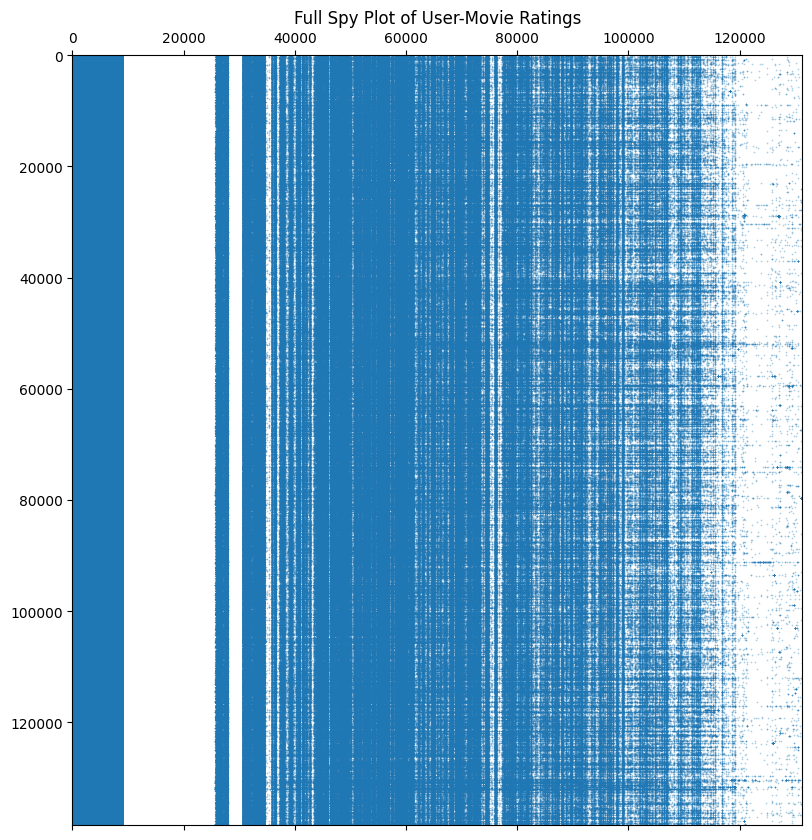

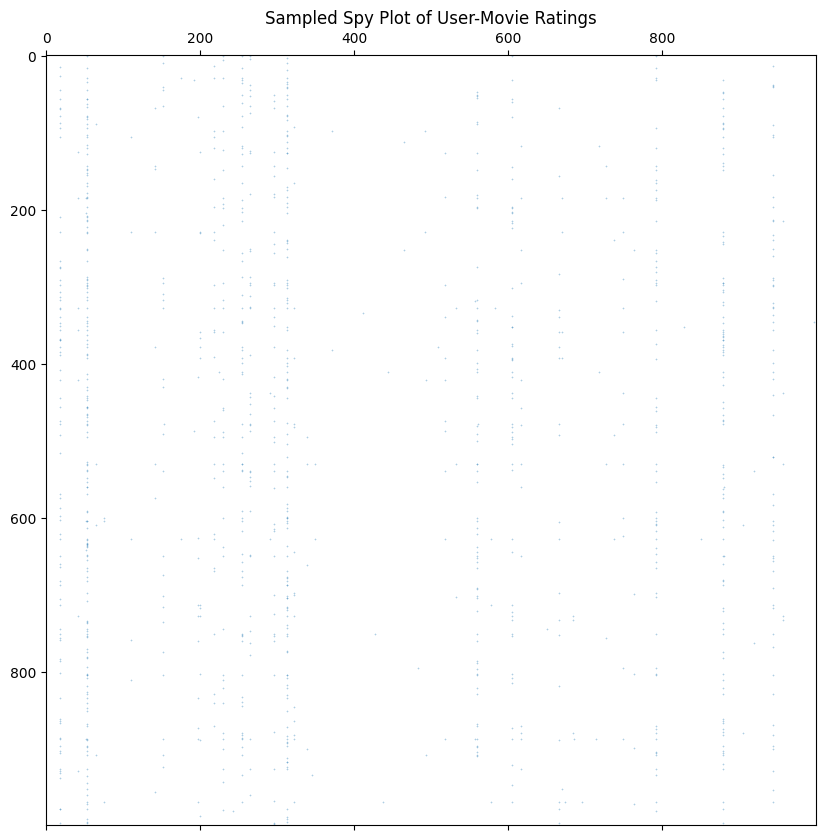

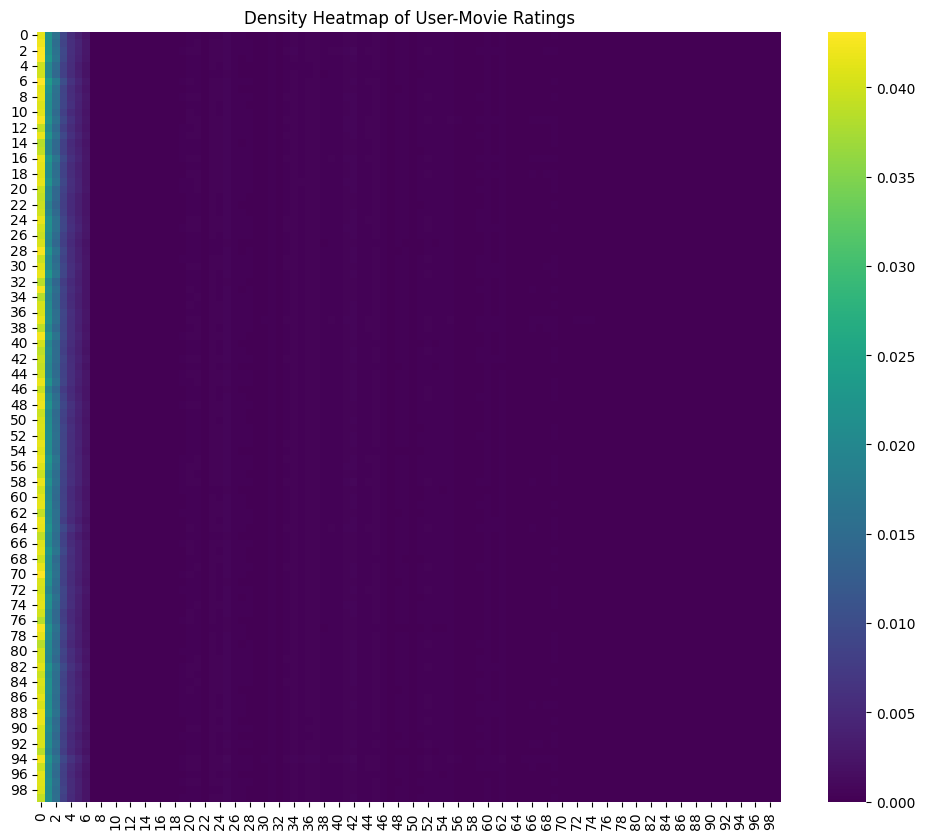

In [9]:
from utils import spy_plot, density_heatmap

# Full Spy Plot (might be very dense and slow for large matrices)
spy_plot(sparse_ratings, title="Full Spy Plot of User-Movie Ratings")

# Sampled Spy Plot
spy_plot(sparse_ratings, sample_size=1000, title="Sampled Spy Plot of User-Movie Ratings")

# Density Heatmap
density_heatmap(sparse_ratings, bins=100, title="Density Heatmap of User-Movie Ratings")

# 3.  Dataset Splitting and Train-Test Division
Train-Test Split

In [17]:
from utils import split_train_test

# Split the dataset
train_sparse_ratings, test_sparse_ratings = split_train_test(sparse_ratings, split_ratio=0.85, user_split_ratio=0.7)

In [18]:
train_sparse_ratings.shape

(138488, 130513)

In [19]:
test_sparse_ratings.shape
 # Get the row sums
row_sums = test_sparse_ratings.sum(axis=1)
# Find rows where the sum is not zero
nonzero_row_indices = np.where(row_sums != 0)[0]
# Filter out zero rows
filtered_matrix = test_sparse_ratings[nonzero_row_indices]
soorat = 0
recall_makhraj = 0
precision_makhraj = 0

print(f"#Users to test: {filtered_matrix.shape[0]}")

#Users to test: 3191


Sparse Representation

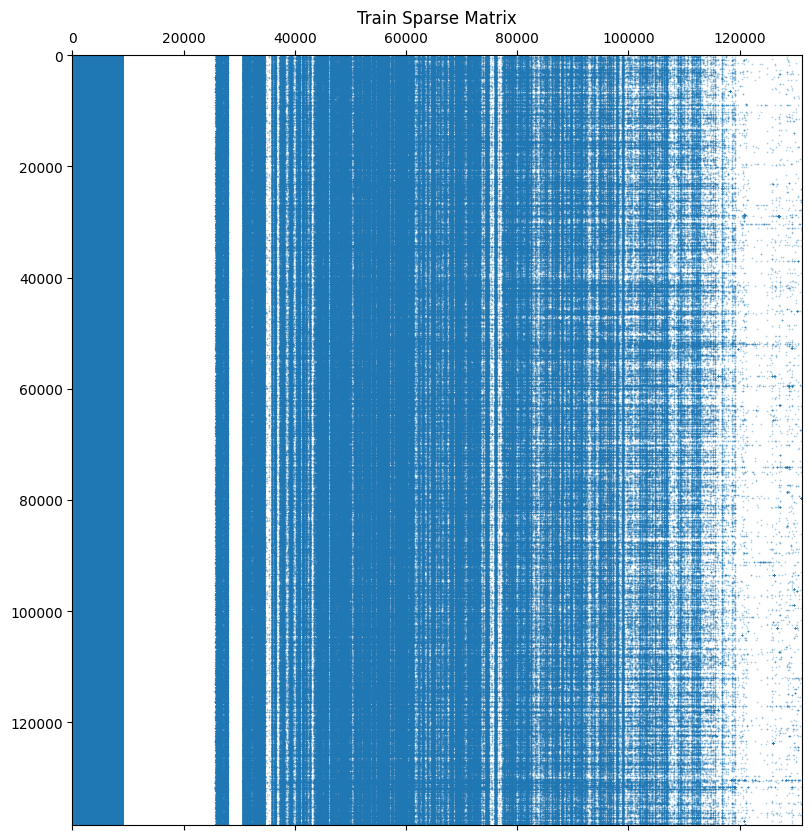

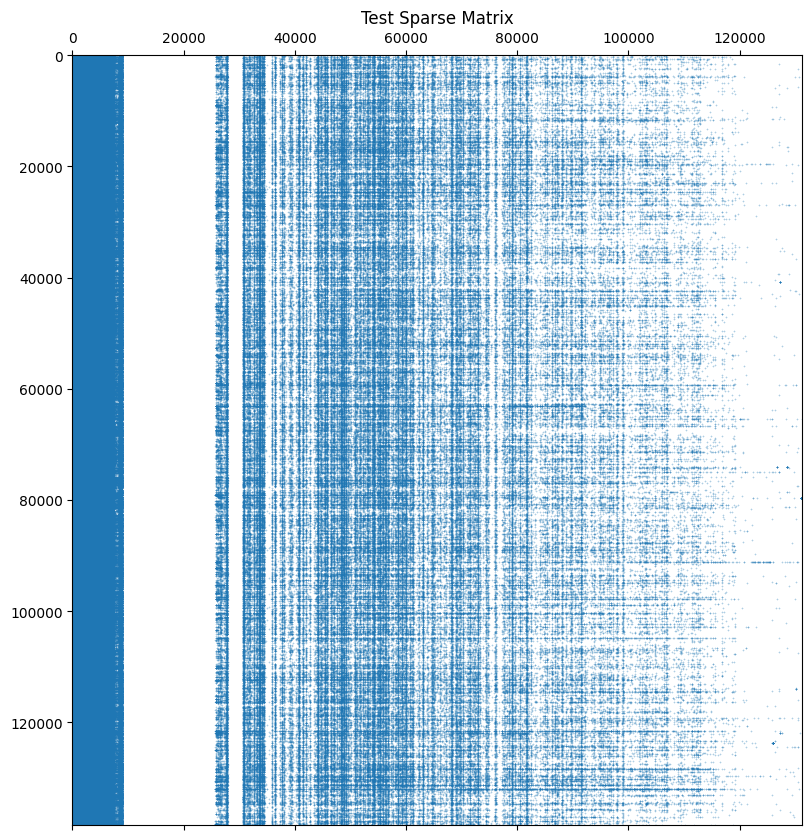

In [13]:
spy_plot(train_sparse_ratings, title='Train Sparse Matrix')
spy_plot(test_sparse_ratings, title='Test Sparse Matrix')

# Train model

In [20]:
from model import Model




model = Model(train_dataset=train_sparse_ratings, tags_dataset=tags_per_movie, movies_dataset=movies, num_hashes=5, num_hash_tables=8, n_factors=20, n_iter=3)    
model.train()

Building LSH
Inserting user 1Inserting user 1

Inserting user 1
Inserting user 1
Inserting user 1
Inserting user 1
Inserting user 1
Inserting user 1
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 5
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 6
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 7
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 11
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 14
Inserting user 18
Inserting user 18
Inserting user 18
Inserting user 18
Inserting user 18
Inserting user 18
Inserting user 18
Inserting user 18
Inserting u

In [21]:
print("Calculating MAE")
print(f"MAE: {model.calculate_mae(test_sparse_ratings)}")

Calculating MAE
#Users to test: 3191
---> Epoch 0
Total error 3.482 ===> Total training time: 0.856 seconds.
---> Epoch 1
Total error 3.481 ===> Total training time: 2.556 seconds.
---> Epoch 2
Total error 3.481 ===> Total training time: 4.447 seconds.
1580
Total error until User 0: 3.0
---> Epoch 0
Total error 3.459 ===> Total training time: 0.824 seconds.
---> Epoch 1
Total error 3.458 ===> Total training time: 3.085 seconds.
---> Epoch 2
Total error 3.458 ===> Total training time: 5.12 seconds.
1342
1610
Total error until User 1: 3.0
---> Epoch 0
Total error 3.473 ===> Total training time: 0.788 seconds.
---> Epoch 1
Total error 3.473 ===> Total training time: 2.994 seconds.
---> Epoch 2
Total error 3.473 ===> Total training time: 4.792 seconds.
1854
Total error until User 2: 3.0
---> Epoch 0
Total error 3.48 ===> Total training time: 0.811 seconds.
---> Epoch 1
Total error 3.48 ===> Total training time: 2.764 seconds.
---> Epoch 2
Total error 3.48 ===> Total training time: 5.028 se

KeyboardInterrupt: 

In [ ]:
print("Rcommending to user 10")
model.recommend(10, 10, 10)